<a href="https://colab.research.google.com/github/Dhanasree-Rajamani/Data-Mining/blob/main/Data%20Mining%20Assignment%202/Regression.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install pycaret

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 320 kB 5.3 MB/s 
     |████████████████████████████████| 6.8 MB 41.8 MB/s 
     |████████████████████████████████| 10.4 MB 21.8 MB/s 
     |████████████████████████████████| 134 kB 38.3 MB/s 
     |████████████████████████████████| 56 kB 3.7 MB/s 
     |████████████████████████████████| 2.0 MB 37.1 MB/s 
     |████████████████████████████████| 1.7 MB 42.8 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 1.3 MB 58.8 MB/s 
     |████████████████████████████████| 3.3 MB 50.8 MB/s 
     |████████████████████████████████| 25.9 MB 1.2 MB/s 
     |████████████████████████████████| 167 kB 58.5 MB/s 
     |████████████████████████████████| 636 kB 54.8 MB/s 
     |████████████████████████████████

In [1]:
from pycaret.utils import enable_colab
enable_colab()

Colab mode enabled.


In [2]:
from pandas_profiling import profile_report
import pandas as pd
import pandas_profiling
from pandas_profiling import ProfileReport

#file = '/content/drive/MyDrive/DataMining_Datasets/ndtv_data_final.csv'
file = 'https://raw.githubusercontent.com/Dhanasree-Rajamani/Data-Mining/main/Data%20Mining%20Assignment%202/DataMining_Datasets/ndtv_data_final.csv' 

data = pd.read_csv(file)
  
data.head()

,Unnamed: 0,Name,Brand,Model,Battery capacity (mAh),Screen size (inches),Touchscreen,Resolution x,Resolution y,Processor,...,Rear camera,Front camera,Operating system,Wi-Fi,Bluetooth,GPS,Number of SIMs,3G,4G/ LTE,Price
0,0,OnePlus 7T Pro McLaren Edition,OnePlus,7T Pro McLaren Edition,4085,6.67,Yes,1440,3120,8,...,48.0,16.0,Android,Yes,Yes,Yes,2,Yes,Yes,58998
1,1,Realme X2 Pro,Realme,X2 Pro,4000,6.50,Yes,1080,2400,8,...,64.0,16.0,Android,Yes,Yes,Yes,2,Yes,Yes,27999
2,2,iPhone 11 Pro Max,Apple,iPhone 11 Pro Max,3969,6.50,Yes,1242,2688,6,...,12.0,12.0,iOS,Yes,Yes,Yes,2,Yes,Yes,106900
3,3,iPhone 11,Apple,iPhone 11,3110,6.10,Yes,828,1792,6,...,12.0,12.0,iOS,Yes,Yes,Yes,2,Yes,Yes,62900
4,4,LG G8X ThinQ,LG,G8X ThinQ,4000,6.40,Yes,1080,2340,8,...,12.0,32.0,Android,Yes,Yes,Yes,1,No,No,49990


In [ ]:
profile = ProfileReport(data)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
data.shape

(1359, 22)

In [3]:
!pip install Jinja2
!pip install markupsafe==2.0.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [4]:
import jinja2

In [5]:
dataset = data.sample(frac=0.9, random_state=786)
data_unseen = data.drop(dataset.index)

#dataset.reset_index(drop=True, inplace=True)
#data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(dataset.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (1223, 22)
Unseen Data For Predictions: (136, 22)


In [6]:
!pip install gradio

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 6.1 MB 5.4 MB/s 
     |████████████████████████████████| 54 kB 3.0 MB/s 
     |████████████████████████████████| 2.3 MB 22.0 MB/s 
     |████████████████████████████████| 55 kB 2.7 MB/s 
     |████████████████████████████████| 84 kB 3.0 MB/s 
     |████████████████████████████████| 270 kB 45.7 MB/s 
     |████████████████████████████████| 112 kB 34.6 MB/s 
     |████████████████████████████████| 57 kB 4.1 MB/s 
     |████████████████████████████████| 84 kB 2.0 MB/s 
     |████████████████████████████████| 212 kB 24.9 MB/s 
     |████████████████████████████████| 63 kB 1.5 MB/s 
     |████████████████████████████████| 80 kB 7.8 MB/s 
     |████████████████████████████████| 68 kB 4.9 MB/s 
     |████████████████████████████████| 43 kB 822 kB/s 
     |████████████████████████████████| 594 kB 41.2 MB/s 
     |████████████████████████████████| 856 kB 46.

In [7]:
from pycaret.regression import *

In [8]:
reg = setup(data = dataset, target = 'Price', ignore_features=['Unnamed: 0', 'Name', 'Brand', 'Model'], session_id=3,
                  normalize = True, transformation = True, transform_target = True, 
                  combine_rare_levels = True, rare_level_threshold = 0.05,
                  remove_multicollinearity = True, multicollinearity_threshold = 0.95, 
                  log_experiment = True, experiment_name = 'mobile_price_regression_') 

,Description,Value
0,session_id,3
1,Target,Price
2,Original Data,"(1223, 22)"
3,Missing Values,False
4,Numeric Features,7
5,Categorical Features,10
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(856, 36)"


INFO:logs:Logging experiment in MLFlow
2022/09/08 22:07:20 INFO mlflow.tracking.fluent: Experiment with name 'mobile_price_regression_' does not exist. Creating a new experiment.
INFO:logs:SubProcess save_model() called ==================================
INFO:logs:Initializing save_model()
INFO:logs:save_model(model=Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True,
                                      features_todrop=['Unnamed: 0', 'Name',
                                                       'Brand', 'Model'],
                                      id_columns=[], ml_usecase='regression',
                                      numerical_features=[], target='Price',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categor

In [9]:
best = compare_models(exclude = ['ransac'])

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,4.329562e+03,8.610082e+07,8.567564e+03,5.434000e-01,0.4592,0.3722,0.131
rf,Random Forest Regressor,4.274716e+03,9.108536e+07,8.720378e+03,5.323000e-01,0.4647,0.3610,0.462
et,Extra Trees Regressor,4.433679e+03,8.447473e+07,8.540873e+03,5.289000e-01,0.5032,0.3997,0.417
huber,Huber Regressor,4.373310e+03,8.603083e+07,8.721297e+03,5.214000e-01,0.4739,0.3651,0.064
lar,Least Angle Regression,4.435840e+03,9.188947e+07,8.914803e+03,5.054000e-01,0.5287,0.3820,0.025
lr,Linear Regression,4.404929e+03,9.198621e+07,8.919111e+03,5.051000e-01,0.4697,0.3705,0.330
ridge,Ridge Regression,4.408851e+03,9.370369e+07,8.968949e+03,5.032000e-01,0.4683,0.3687,0.020
br,Bayesian Ridge,4.507451e+03,1.010154e+08,9.257072e+03,4.787000e-01,0.4705,0.3691,0.022
gbr,Gradient Boosting Regressor,4.438939e+03,1.109345e+08,9.572719e+03,4.362000e-01,0.4590,0.3639,0.123
knn,K Neighbors Regressor,4.686194e+03,1.086696e+08,9.604034e+03,4.251000e-01,0.5008,0.3797,0.069


INFO:logs:create_model_container: 18
INFO:logs:master_model_container: 18
INFO:logs:display_container: 2
INFO:logs:PowerTransformedTargetRegressor(boosting_type='gbdt', class_weight=None,
                                colsample_bytree=1.0, importance_type='split',
                                learning_rate=0.1, max_depth=-1,
                                min_child_samples=20, min_child_weight=0.001,
                                min_split_gain=0.0, n_estimators=100, n_jobs=-1,
                                num_leaves=31, objective=None,
                                power_transformer_method='box-cox',
                                power_transformer_standardize=True,
                                random_state=3...
                                                        importance_type='split',
                                                        learning_rate=0.1,
                                                        max_depth=-1,
                                  

In [10]:
models()
#exclude = ['ID']

INFO:logs:gpu_param set to False


,Name,Reference,Turbo
ID,,,
lr,Linear Regression,sklearn.linear_model._base.LinearRegression,True
lasso,Lasso Regression,sklearn.linear_model._coordinate_descent.Lasso,True
ridge,Ridge Regression,sklearn.linear_model._ridge.Ridge,True
en,Elastic Net,sklearn.linear_model._coordinate_descent.Elast...,True
lar,Least Angle Regression,sklearn.linear_model._least_angle.Lars,True
llar,Lasso Least Angle Regression,sklearn.linear_model._least_angle.LassoLars,True
omp,Orthogonal Matching Pursuit,sklearn.linear_model._omp.OrthogonalMatchingPu...,True
br,Bayesian Ridge,sklearn.linear_model._bayes.BayesianRidge,True
ard,Automatic Relevance Determination,sklearn.linear_model._bayes.ARDRegression,False


In [11]:
rf = create_model('rf', round=2)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,4787.73,1.010195e+08,10050.85,0.60,0.55,0.52
1,6920.12,3.434054e+08,18531.20,0.33,0.57,0.41
2,3170.82,2.668310e+07,5165.57,0.65,0.44,0.35
3,3864.12,3.979773e+07,6308.54,0.50,0.49,0.44
4,4228.39,7.454517e+07,8633.95,0.62,0.42,0.31
5,3188.27,2.975437e+07,5454.76,0.40,0.42,0.31
6,3353.42,2.702113e+07,5198.19,0.63,0.43,0.34
7,3049.43,4.888742e+07,6991.95,0.58,0.33,0.24
8,5410.39,1.306712e+08,11431.15,0.48,0.54,0.35


INFO:logs:create_model_container: 19
INFO:logs:master_model_container: 19
INFO:logs:display_container: 3
INFO:logs:PowerTransformedTargetRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                                max_depth=None, max_features='auto',
                                max_leaf_nodes=None, max_samples=None,
                                min_impurity_decrease=0.0,
                                min_impurity_split=None, min_samples_leaf=1,
                                min_samples_split=2,
                                min_weight_fraction_leaf=0.0, n_estimators=100,
                                n_jobs=-1, oob_score=False,
                                power_transformer_method='box-cox',
                                power...
                                regressor=RandomForestRegressor(bootstrap=True,
                                                                ccp_alpha=0.0,
                                                                crit

In [12]:
knn = create_model('knn')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,5046.3219,1.212007e+08,11009.1167,0.5175,0.5521,0.4882
1,7390.5982,4.018734e+08,20046.7810,0.2194,0.5972,0.3903
2,3548.4877,3.660933e+07,6050.5642,0.5227,0.5039,0.3878
3,4235.7149,5.535614e+07,7440.1704,0.3012,0.5041,0.4572
4,5497.2658,1.281757e+08,11321.4721,0.3542,0.5169,0.3757
5,3612.8706,3.409113e+07,5838.7611,0.3075,0.4560,0.3497
6,3889.4437,3.714023e+07,6094.2785,0.4880,0.4859,0.3836
7,3270.9918,5.678732e+07,7535.7363,0.5152,0.3915,0.2645
8,5467.5717,1.234025e+08,11108.6665,0.5128,0.5539,0.3841


INFO:logs:create_model_container: 20
INFO:logs:master_model_container: 20
INFO:logs:display_container: 4
INFO:logs:PowerTransformedTargetRegressor(algorithm='auto', leaf_size=30,
                                metric='minkowski', metric_params=None,
                                n_jobs=-1, n_neighbors=5, p=2,
                                power_transformer_method='box-cox',
                                power_transformer_standardize=True,
                                regressor=KNeighborsRegressor(algorithm='auto',
                                                              leaf_size=30,
                                                              metric='minkowski',
                                                              metric_params=None,
                                                              n_jobs=-1,
                                                              n_neighbors=5,
                                                              p=2,
             

In [13]:
print(knn)

PowerTransformedTargetRegressor(algorithm='auto', leaf_size=30,
                                metric='minkowski', metric_params=None,
                                n_jobs=-1, n_neighbors=5, p=2,
                                power_transformer_method='box-cox',
                                power_transformer_standardize=True,
                                regressor=KNeighborsRegressor(algorithm='auto',
                                                              leaf_size=30,
                                                              metric='minkowski',
                                                              metric_params=None,
                                                              n_jobs=-1,
                                                              n_neighbors=5,
                                                              p=2,
                                                              weights='uniform'),
                                weights='unifo

In [14]:
!pip install matplotlib==3.1.3

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 13.1 MB 4.5 MB/s 
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.2.2
    Uninstalling matplotlib-3.2.2:
      Successfully uninstalled matplotlib-3.2.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pandas-profiling 3.3.0 requires matplotlib<3.6,>=3.2, but you have matplotlib 3.1.3 which is incompatible.


In [15]:
top3 = compare_models(exclude = ['ransac'], n_select = 3)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,4.329562e+03,8.610082e+07,8.567564e+03,5.434000e-01,0.4592,0.3722,0.061
rf,Random Forest Regressor,4.274716e+03,9.108536e+07,8.720378e+03,5.323000e-01,0.4647,0.3610,0.641
et,Extra Trees Regressor,4.433679e+03,8.447473e+07,8.540873e+03,5.289000e-01,0.5032,0.3997,0.588
huber,Huber Regressor,4.373310e+03,8.603083e+07,8.721297e+03,5.214000e-01,0.4739,0.3651,0.129
lar,Least Angle Regression,4.435840e+03,9.188947e+07,8.914803e+03,5.054000e-01,0.5287,0.3820,0.074
lr,Linear Regression,4.404929e+03,9.198621e+07,8.919111e+03,5.051000e-01,0.4697,0.3705,0.053
ridge,Ridge Regression,4.408851e+03,9.370369e+07,8.968949e+03,5.032000e-01,0.4683,0.3687,0.049
br,Bayesian Ridge,4.507451e+03,1.010154e+08,9.257072e+03,4.787000e-01,0.4705,0.3691,0.037
gbr,Gradient Boosting Regressor,4.438939e+03,1.109345e+08,9.572719e+03,4.362000e-01,0.4590,0.3639,0.190
knn,K Neighbors Regressor,4.686194e+03,1.086696e+08,9.604034e+03,4.251000e-01,0.5008,0.3797,0.102


INFO:logs:create_model_container: 38
INFO:logs:master_model_container: 38
INFO:logs:display_container: 5
INFO:logs:[PowerTransformedTargetRegressor(boosting_type='gbdt', class_weight=None,
                                colsample_bytree=1.0, importance_type='split',
                                learning_rate=0.1, max_depth=-1,
                                min_child_samples=20, min_child_weight=0.001,
                                min_split_gain=0.0, n_estimators=100, n_jobs=-1,
                                num_leaves=31, objective=None,
                                power_transformer_method='box-cox',
                                power_transformer_standardize=True,
                                random_state=3...
                                                        importance_type='split',
                                                        learning_rate=0.1,
                                                        max_depth=-1,
                                 

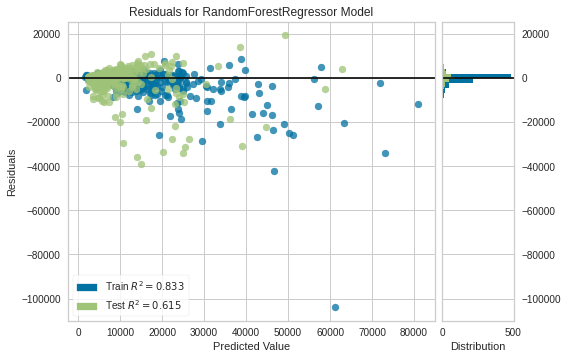

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [16]:
plot_model(rf)

In [17]:
tuned_rf = tune_model(rf)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,5404.7115,1.532693e+08,12380.1968,0.3899,0.5831,0.5340
1,7330.3682,3.962385e+08,19905.7416,0.2303,0.5652,0.3649
2,3410.0825,3.958393e+07,6291.5763,0.4839,0.4315,0.3397
3,3759.7813,3.386537e+07,5819.3964,0.5725,0.5030,0.4672
4,4852.5614,1.247361e+08,11168.5323,0.3715,0.4648,0.3080
5,2928.1368,2.388549e+07,4887.2784,0.5148,0.3953,0.2925
6,3714.1585,3.997328e+07,6322.4424,0.4489,0.4404,0.3470
7,3450.9314,5.805160e+07,7619.1600,0.5044,0.3615,0.2820
8,6006.0624,1.595613e+08,12631.7588,0.3701,0.5526,0.3640


INFO:logs:create_model_container: 39
INFO:logs:master_model_container: 39
INFO:logs:display_container: 6
INFO:logs:PowerTransformedTargetRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                                max_depth=7, max_features='sqrt',
                                max_leaf_nodes=None, max_samples=None,
                                min_impurity_decrease=0.001,
                                min_impurity_split=None, min_samples_leaf=4,
                                min_samples_split=10,
                                min_weight_fraction_leaf=0.0, n_estimators=300,
                                n_jobs=-1, oob_score=False,
                                power_transformer_method='box-cox',
                                power...
                                regressor=RandomForestRegressor(bootstrap=True,
                                                                ccp_alpha=0.0,
                                                                crit

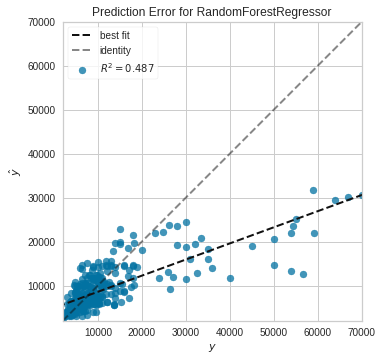

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [18]:
plot_model(tuned_rf, plot = 'error')

In [19]:
create_app(tuned_rf)

INFO:logs:Initializing get_config()
INFO:logs:get_config(variable=data_before_preprocess)
INFO:logs:Global variable: data_before_preprocess returned as       Unnamed: 0                       Name     Brand             Model  \
991          991           Meizu Pro 6 Plus     Meizu        Pro 6 Plus   
245          245            Motorola Moto X  Motorola            Moto X   
53            53                    Honor 8     Honor                 8   
1019        1019                  Vivo Y55L      Vivo              Y55L   
741          741                 Coolpad A1   Coolpad                A1   
...          ...                        ...       ...               ...   
1256        1256  Micromax Canvas Blaze 4G+  Micromax  Canvas Blaze 4G+   
1338        1338        Lava Iris X1 Selfie      Lava    Iris X1 Selfie   
344          344           Motorola Moto G5  Motorola           Moto G5   
1219        1219       Intex Cloud 4G Smart     Intex    Cloud 4G Smart   
18            18       

Colab notebook detected. To show errors in colab notebook, set `debug=True` in `launch()`
Running on public URL: https://25257.gradio.app

This share link expires in 72 hours. For free permanent hosting, check out Spaces: https://huggingface.co/spaces


(<gradio.routes.App at 0x7f3a61263b10>,
 'http://127.0.0.1:7860/',
 'https://25257.gradio.app')

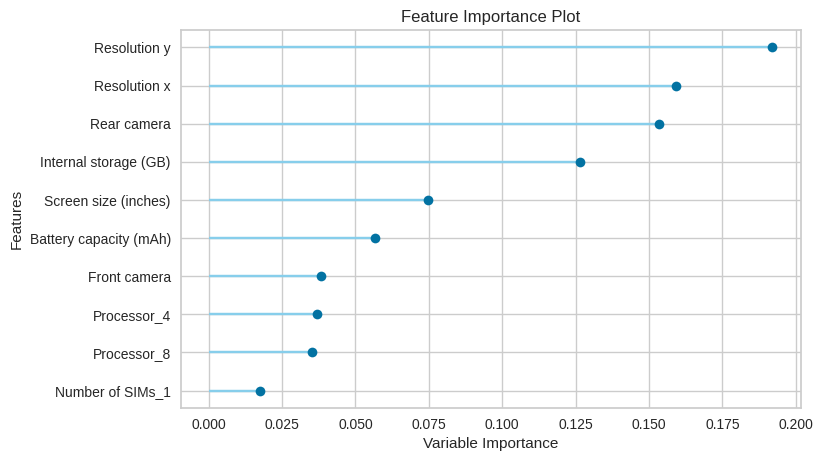

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [20]:
plot_model(tuned_rf, plot = 'feature')

In [21]:
plot_model(tuned_rf, plot = 'parameter')

,Parameters
bootstrap,True
ccp_alpha,0.0
criterion,mse
max_depth,7
max_features,sqrt
max_leaf_nodes,None
max_samples,None
min_impurity_decrease,0.001
min_impurity_split,None
min_samples_leaf,4


INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [22]:
dt = create_model('dt')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,5631.5981,1.232293e+08,11100.8710,0.5095,0.6625,0.6734
1,7798.7672,3.453511e+08,18583.6253,0.3292,0.6920,0.5494
2,4210.6636,5.056569e+07,7110.9553,0.3407,0.6171,0.5079
3,4287.1448,4.434391e+07,6659.1221,0.4403,0.6060,0.4705
4,5231.0726,8.815895e+07,9389.2996,0.5558,0.5230,0.4747
5,4768.6854,6.065807e+07,7788.3291,-0.2321,0.5616,0.4650
6,5105.4078,8.707218e+07,9331.2476,-0.2004,0.6618,0.5711
7,3863.5884,4.626124e+07,6801.5617,0.6051,0.4923,0.4210
8,6632.8124,1.783562e+08,13355.0081,0.2959,0.7514,0.4524


INFO:logs:create_model_container: 40
INFO:logs:master_model_container: 40
INFO:logs:display_container: 7
INFO:logs:PowerTransformedTargetRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                                max_features=None, max_leaf_nodes=None,
                                min_impurity_decrease=0.0,
                                min_impurity_split=None, min_samples_leaf=1,
                                min_samples_split=2,
                                min_weight_fraction_leaf=0.0,
                                power_transformer_method='box-cox',
                                power_transformer_standardize=True,
                                presort='deprecated', random_state=3,
                                regressor=DecisionTreeRegressor(ccp_alpha=0.0,
                                                                criterion='mse',
                                                                max_depth=None,
                                    

In [23]:
bagged_dt = ensemble_model(dt)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,4912.2118,1.067053e+08,10329.8264,0.5752,0.5636,0.5388
1,6624.9763,2.952459e+08,17182.7211,0.4265,0.5859,0.4091
2,3155.3730,2.797859e+07,5289.4793,0.6352,0.4353,0.3312
3,3949.4009,4.386970e+07,6623.4205,0.4462,0.4881,0.4319
4,4297.7345,7.629991e+07,8734.9820,0.6156,0.4196,0.3167
5,3404.5371,3.169047e+07,5629.4287,0.3563,0.4251,0.3380
6,3689.4763,3.460088e+07,5882.2514,0.5230,0.4558,0.3648
7,3254.4576,4.818764e+07,6941.7320,0.5886,0.3646,0.2800
8,5487.9769,1.362944e+08,11674.5213,0.4619,0.5522,0.3648


INFO:logs:create_model_container: 41
INFO:logs:master_model_container: 41
INFO:logs:display_container: 8
INFO:logs:PowerTransformedTargetRegressor(base_estimator=DecisionTreeRegressor(ccp_alpha=0.0,
                                                                     criterion='mse',
                                                                     max_depth=None,
                                                                     max_features=None,
                                                                     max_leaf_nodes=None,
                                                                     min_impurity_decrease=0.0,
                                                                     min_impurity_split=None,
                                                                     min_samples_leaf=1,
                                                                     min_samples_split=2,
                                                                     min_weight_fra

In [24]:
print(bagged_dt)

PowerTransformedTargetRegressor(base_estimator=DecisionTreeRegressor(ccp_alpha=0.0,
                                                                     criterion='mse',
                                                                     max_depth=None,
                                                                     max_features=None,
                                                                     max_leaf_nodes=None,
                                                                     min_impurity_decrease=0.0,
                                                                     min_impurity_split=None,
                                                                     min_samples_leaf=1,
                                                                     min_samples_split=2,
                                                                     min_weight_fraction_leaf=0.0,
                                                                     presort='deprecated',
        

In [25]:
boosted_dt = ensemble_model(dt, method = 'Boosting')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,5106.3630,1.057085e+08,10281.4651,0.5792,0.6079,0.5986
1,6395.7467,2.314137e+08,15212.2872,0.5505,0.5871,0.4600
2,3603.0952,3.912155e+07,6254.7220,0.4899,0.4579,0.3910
3,3908.5057,4.304159e+07,6560.6086,0.4567,0.5616,0.4256
4,4516.5563,6.726957e+07,8201.8026,0.6611,0.4701,0.3435
5,3628.4434,2.974638e+07,5454.0242,0.3958,0.4810,0.3907
6,3923.5295,4.009227e+07,6331.8453,0.4473,0.5024,0.4030
7,3192.9989,5.899955e+07,7681.1163,0.4963,0.3664,0.2478
8,5860.2707,1.334311e+08,11551.2379,0.4732,0.6335,0.4331


INFO:logs:create_model_container: 42
INFO:logs:master_model_container: 42
INFO:logs:display_container: 9
INFO:logs:PowerTransformedTargetRegressor(base_estimator=DecisionTreeRegressor(ccp_alpha=0.0,
                                                                     criterion='mse',
                                                                     max_depth=None,
                                                                     max_features=None,
                                                                     max_leaf_nodes=None,
                                                                     min_impurity_decrease=0.0,
                                                                     min_impurity_split=None,
                                                                     min_samples_leaf=1,
                                                                     min_samples_split=2,
                                                                     min_weight_fra

In [26]:
bagged_dt2 = ensemble_model(dt, n_estimators=50)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,4756.0691,9.286127e+07,9636.4552,0.6304,0.5526,0.5299
1,6904.8538,3.368264e+08,18352.8301,0.3457,0.5699,0.4104
2,3149.0144,2.728442e+07,5223.4491,0.6443,0.4496,0.3486
3,3846.9612,3.709681e+07,6090.7150,0.5317,0.4886,0.4507
4,4420.7621,7.723162e+07,8788.1523,0.6109,0.4272,0.3257
5,3162.5821,2.829597e+07,5319.3953,0.4253,0.4148,0.3083
6,3384.9158,2.744114e+07,5238.4292,0.6217,0.4283,0.3489
7,3110.0434,5.195474e+07,7207.9635,0.5565,0.3389,0.2432
8,5393.2318,1.291521e+08,11364.5112,0.4901,0.5369,0.3477


INFO:logs:create_model_container: 43
INFO:logs:master_model_container: 43
INFO:logs:display_container: 10
INFO:logs:PowerTransformedTargetRegressor(base_estimator=DecisionTreeRegressor(ccp_alpha=0.0,
                                                                     criterion='mse',
                                                                     max_depth=None,
                                                                     max_features=None,
                                                                     max_leaf_nodes=None,
                                                                     min_impurity_decrease=0.0,
                                                                     min_impurity_split=None,
                                                                     min_samples_leaf=1,
                                                                     min_samples_split=2,
                                                                     min_weight_fr

In [27]:
test_pred = predict_model(tuned_rf, data =data_unseen)

INFO:logs:Initializing predict_model()
INFO:logs:predict_model(estimator=PowerTransformedTargetRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                                max_depth=7, max_features='sqrt',
                                max_leaf_nodes=None, max_samples=None,
                                min_impurity_decrease=0.001,
                                min_impurity_split=None, min_samples_leaf=4,
                                min_samples_split=10,
                                min_weight_fraction_leaf=0.0, n_estimators=300,
                                n_jobs=-1, oob_score=False,
                                power_transformer_method='box-cox',
                                power...
                                regressor=RandomForestRegressor(bootstrap=True,
                                                                ccp_alpha=0.0,
                                                                criterion='mse',
                             

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Random Forest Regressor,6280.7021,3.162003e+08,17782.021,0.2671,0.5106,0.3226


In [28]:
test_pred.head()

,Unnamed: 0,Name,Brand,Model,Battery capacity (mAh),Screen size (inches),Touchscreen,Resolution x,Resolution y,Processor,...,Front camera,Operating system,Wi-Fi,Bluetooth,GPS,Number of SIMs,3G,4G/ LTE,Price,Label
5,5,OnePlus 7T,OnePlus,7T,3800,6.55,Yes,1080,2400,8,...,16.0,Android,Yes,Yes,No,2,Yes,Yes,34930,23723.671047
7,7,Samsung Galaxy Note 10+,Samsung,Galaxy Note 10+,4300,6.80,Yes,1440,3040,8,...,10.0,Android,Yes,Yes,Yes,2,Yes,Yes,79699,32115.292775
13,13,OnePlus 7 Pro,OnePlus,7 Pro,4000,6.67,Yes,1440,3120,8,...,16.0,Android,Yes,Yes,Yes,2,Yes,Yes,39995,31017.040706
17,17,Redmi Note 7 Pro,Xiaomi,Redmi Note 7 Pro,4000,6.30,Yes,1080,2340,8,...,13.0,Android,Yes,Yes,Yes,2,Yes,Yes,9799,15394.912978
32,32,Asus ZenFone 5Z (ZS620KL),Asus,ZenFone 5Z (ZS620KL),3300,6.20,Yes,1080,2246,8,...,8.0,Android,Yes,Yes,Yes,2,Yes,Yes,18999,15727.008007


In [29]:
save_model(tuned_rf, 'regression model')

INFO:logs:Initializing save_model()
INFO:logs:save_model(model=PowerTransformedTargetRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                                max_depth=7, max_features='sqrt',
                                max_leaf_nodes=None, max_samples=None,
                                min_impurity_decrease=0.001,
                                min_impurity_split=None, min_samples_leaf=4,
                                min_samples_split=10,
                                min_weight_fraction_leaf=0.0, n_estimators=300,
                                n_jobs=-1, oob_score=False,
                                power_transformer_method='box-cox',
                                power...
                                regressor=RandomForestRegressor(bootstrap=True,
                                                                ccp_alpha=0.0,
                                                                criterion='mse',
                                       

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True,
                                       features_todrop=['Unnamed: 0', 'Name',
                                                        'Brand', 'Model'],
                                       id_columns=[], ml_usecase='regression',
                                       numerical_features=[], target='Price',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value...
                                                                                  ccp_alpha=0.0,
                                                                                  criterion='mse',
                                                    

In [30]:
saved_final_model = load_model('regression model')

INFO:logs:Initializing load_model()
INFO:logs:load_model(model_name=regression model, platform=None, authentication=None, verbose=True)


Transformation Pipeline and Model Successfully Loaded


In [31]:
new_pred = predict_model(saved_final_model, data=data_unseen)

INFO:logs:Initializing predict_model()
INFO:logs:predict_model(estimator=Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True,
                                      features_todrop=['Unnamed: 0', 'Name',
                                                       'Brand', 'Model'],
                                      id_columns=[], ml_usecase='regression',
                                      numerical_features=[], target='Price',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value...
                                                                                 ccp_alpha=0.0,
                                                                                 criterion='

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Random Forest Regressor,6280.7021,3.162003e+08,17782.021,0.2671,0.5106,0.3226


In [32]:
new_pred.tail()

,Unnamed: 0,Name,Brand,Model,Battery capacity (mAh),Screen size (inches),Touchscreen,Resolution x,Resolution y,Processor,...,Front camera,Operating system,Wi-Fi,Bluetooth,GPS,Number of SIMs,3G,4G/ LTE,Price,Label
1323,1323,Panasonic Eluga L2,Panasonic,Eluga L2,2500,5.5,Yes,540,960,4,...,2.0,Android,Yes,Yes,Yes,2,Yes,Yes,3990,5687.167015
1331,1331,Intex Aqua Dream II,Intex,Aqua Dream II,2300,5.5,Yes,720,1280,4,...,2.0,Android,Yes,Yes,Yes,2,Yes,No,8200,5791.555821
1343,1343,Intex Aqua Y2 Power,Intex,Aqua Y2 Power,2900,4.0,Yes,480,800,4,...,2.0,Android,Yes,Yes,Yes,2,Yes,No,4050,3320.795655
1344,1344,LG Max,LG,Max,2540,5.0,Yes,480,854,4,...,5.0,Android,Yes,Yes,Yes,2,Yes,No,3999,4432.038015
1358,1358,iBall Andi Avonte 5,iBall,Andi Avonte 5,2150,5.0,Yes,480,854,4,...,0.0,Android,Yes,Yes,Yes,2,Yes,No,3999,4612.103066


In [33]:
# train individual models to blend
lightgbm = create_model('lightgbm', verbose = False)
dt = create_model('dt', verbose = False)
rf = create_model('rf', verbose = False)

INFO:logs:Initializing create_model()
INFO:logs:create_model(estimator=lightgbm, fold=None, round=4, cross_validation=True, predict=True, fit_kwargs=None, groups=None, refit=True, verbose=False, system=True, metrics=None, experiment_custom_tags=None, add_to_model_list=True, probability_threshold=None, display=None, return_train_score=False, kwargs={})
INFO:logs:Checking exceptions
INFO:logs:Importing libraries
INFO:logs:Copying training dataset
INFO:logs:Defining folds
INFO:logs:Declaring metric variables
INFO:logs:Importing untrained model
INFO:logs:Light Gradient Boosting Machine Imported succesfully
INFO:logs:Starting cross validation
INFO:logs:Cross validating with KFold(n_splits=10, random_state=None, shuffle=False), n_jobs=-1
INFO:logs:Calculating mean and std
INFO:logs:Creating metrics dataframe
INFO:logs:Finalizing model
INFO:logs:Creating Dashboard logs
INFO:logs:Model: Light Gradient Boosting Machine
INFO:logs:logged params: {'boosting_type': 'gbdt', 'class_weight': None, 'co

In [34]:
# blend individual models
blender = blend_models(estimator_list = [lightgbm, dt, rf])

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,4656.2350,9.916523e+07,9958.1741,0.6053,0.5533,0.5217
1,7004.1228,3.225161e+08,17958.7321,0.3735,0.5682,0.4376
2,3201.3645,2.347969e+07,4845.5841,0.6939,0.4584,0.3721
3,3692.8995,3.393758e+07,5825.5972,0.5716,0.4892,0.4166
4,4227.3860,6.917683e+07,8317.2612,0.6514,0.4187,0.3283
5,3431.4537,3.152449e+07,5614.6678,0.3597,0.4414,0.3328
6,3339.6078,2.712756e+07,5208.4127,0.6260,0.4550,0.3583
7,3092.6232,3.965920e+07,6297.5547,0.6614,0.3417,0.2629
8,5807.8125,1.431993e+08,11966.5921,0.4347,0.5853,0.3870


INFO:logs:create_model_container: 47
INFO:logs:master_model_container: 47
INFO:logs:display_container: 16
INFO:logs:PowerTransformedTargetRegressor(estimators=[('lightgbm',
                                             LGBMRegressor(boosting_type='gbdt',
                                                           class_weight=None,
                                                           colsample_bytree=1.0,
                                                           importance_type='split',
                                                           learning_rate=0.1,
                                                           max_depth=-1,
                                                           min_child_samples=20,
                                                           min_child_weight=0.001,
                                                           min_split_gain=0.0,
                                                           n_estimators=100,
                                

In [35]:
# blend top3 models from compare_models
blender_top3 = blend_models(top3)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,4649.1693,9.997948e+07,9998.9742,0.6020,0.5303,0.4938
1,6850.8195,3.150168e+08,17748.7115,0.3881,0.5597,0.4180
2,3386.3269,2.690063e+07,5186.5816,0.6493,0.4576,0.3703
3,3821.6288,4.041532e+07,6357.3044,0.4898,0.4832,0.4380
4,4147.2587,7.062409e+07,8403.8141,0.6441,0.4186,0.3049
5,3237.5466,2.941102e+07,5423.1929,0.4026,0.4219,0.3195
6,3323.5935,2.702119e+07,5198.1909,0.6275,0.4289,0.3517
7,2827.0614,3.960468e+07,6293.2249,0.6619,0.3162,0.2356
8,5433.1482,1.157326e+08,10757.9076,0.5431,0.5342,0.3758


INFO:logs:create_model_container: 48
INFO:logs:master_model_container: 48
INFO:logs:display_container: 17
INFO:logs:PowerTransformedTargetRegressor(estimators=[('lightgbm',
                                             LGBMRegressor(boosting_type='gbdt',
                                                           class_weight=None,
                                                           colsample_bytree=1.0,
                                                           importance_type='split',
                                                           learning_rate=0.1,
                                                           max_depth=-1,
                                                           min_child_samples=20,
                                                           min_child_weight=0.001,
                                                           min_split_gain=0.0,
                                                           n_estimators=100,
                                

In [36]:
print(blender_top3.estimators_)

[LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
              n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
              random_state=3, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0), RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=-1, oob_score=False,
                      random_state=3, verbose=0, warm_start=False), ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, c